#### CSCA 5642 Introduction to Deep Learning
# I’m Something of a Painter Myself

***

## Brief Description of the Problem and Data (5 pts)

The challenge is to **generate paintings using Generative Adversarial Networks (GANs)**. This task is crucial for advancing AI in creative domains, allowing for the synthesis of realistic artwork. A GAN model will be employed due to its effectiveness in generating high-quality images.

The data is sourced from the [I’m Something of a Painter Myself Dataset](https://www.kaggle.com/competitions/gan-getting-started/data). The dataset(385.87 MB) contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos. The monet directories contain Monet paintings and those will be used to train our model. The photo directories contain photos.

- monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
- monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
- photo_jpg - 7028 photos sized 256x256 in JPEG format
- photo_tfrec - 7028 photos sized 256x256 in TFRecord format

***
## Exploratory Data Analysis (EDA) — Inspect, Visualize and Clean the Data (15 pts)

In the EDA step, we will examine the dataset, display images and compute statistics on them, then visualize those statistics to gain more insight about the image dataset. Finally, we will discuss the plan for analysis.

### Display Sample Images

Firstly, let's display sample images for Monet Paintings and Photos and observe their difference.

In [7]:
import os
import glob
import zipfile
import random
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch

# Paths to data directories
monet_jpg_dir = '/kaggle/input/gan-getting-started/monet_jpg'
photo_jpg_dir = '/kaggle/input/gan-getting-started/photo_jpg'
monet_tfrec_dir = '/kaggle/input/gan-getting-started/monet_tfrec'
photo_tfrec_dir = '/kaggle/input/gan-getting-started/photo_tfrec'
output_zip_path = 'images.zip'

# Custom dataset for loading the images
class ImageDataset(Dataset):
    def __init__(self, root, transform=None):
        self.transform = transform
        self.files = sorted(glob.glob(root + '/*.*'))

    def __getitem__(self, index):
        img = Image.open(self.files[index])
        if self.transform:
            img = self.transform(img)
        return img

    def __len__(self):
        return len(self.files)

# Image transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Creating datasets and dataloaders
monet_dataset = ImageDataset(monet_jpg_dir, transform=transform)
photo_dataset = ImageDataset(photo_jpg_dir, transform=transform)

monet_loader = DataLoader(monet_dataset, batch_size=16, shuffle=True)
photo_loader = DataLoader(photo_dataset, batch_size=16, shuffle=True)

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to display a batch of images
def imshow(img, title=None):
    img = img / 2 + 0.5  # Unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(12, 12))  # Increase the size of the figure
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    if title is not None:
        plt.title(title)
    plt.axis('off')  # Turn off axis
    plt.show()

Sample Monet Paintings:


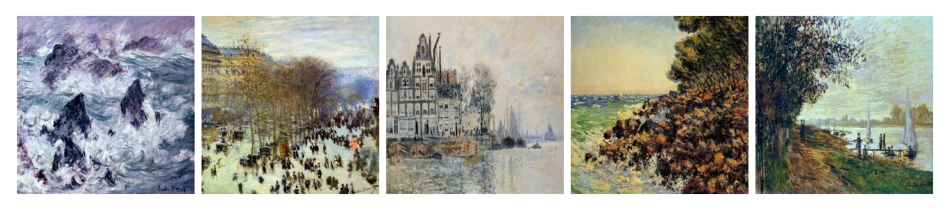

Sample Photos:


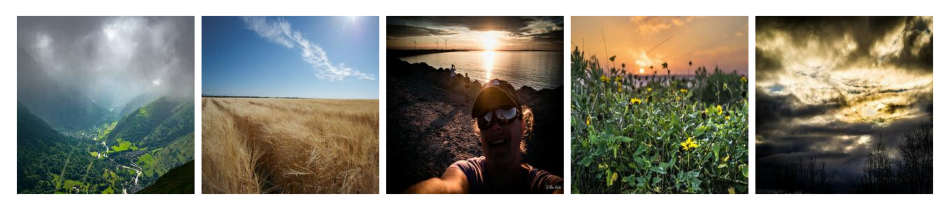

In [9]:
import torchvision

# Show a few Monet paintings
monet_sample_loader = DataLoader(monet_dataset, batch_size=5, shuffle=True)
dataiter = iter(monet_sample_loader)
images = next(dataiter)  # Corrected usage
print("Sample Monet Paintings:")
imshow(torchvision.utils.make_grid(images, padding=10, pad_value=1))

# Show a few photos
photo_sample_loader = DataLoader(photo_dataset, batch_size=5, shuffle=True)
dataiter = iter(photo_sample_loader)
images = next(dataiter)  # Corrected usage
print("Sample Photos:")
imshow(torchvision.utils.make_grid(images, padding=10, pad_value=1))


### Image Statistics

Then we examine the number of images and compute the mean and standard deviation of the pixel values for both datasets. These statistics are useful for understanding the distribution and normalization of the data.

In [10]:
# Get the number of images in each dataset
num_monet_images = len(monet_dataset)
num_photo_images = len(photo_dataset)

print(f"Number of Monet paintings: {num_monet_images}")
print(f"Number of photos: {num_photo_images}")

# Calculate average pixel values
def calculate_mean_std(loader):
    mean = 0.
    std = 0.
    nb_samples = 0.

    for data in loader:
        batch_samples = data.size(0)
        data = data.view(batch_samples, data.size(1), -1)
        mean += data.mean(2).sum(0)
        std += data.std(2).sum(0)
        nb_samples += batch_samples

    mean /= nb_samples
    std /= nb_samples
    return mean, std

monet_mean, monet_std = calculate_mean_std(monet_loader)
photo_mean, photo_std = calculate_mean_std(photo_loader)

print(f"Monet dataset mean: {monet_mean}, std: {monet_std}")
print(f"Photo dataset mean: {photo_mean}, std: {photo_std}")


Number of Monet paintings: 300
Number of photos: 7038
Monet dataset mean: tensor([ 0.0428,  0.0488, -0.0465]), std: tensor([0.3824, 0.3644, 0.3884])
Photo dataset mean: tensor([-0.1924, -0.1828, -0.2319]), std: tensor([0.4438, 0.4055, 0.4396])


We could also create histograms for the pixel values in each dataset. This helps visualize the distribution of pixel intensities, which can provide insights into differences in color and brightness between the datasets.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


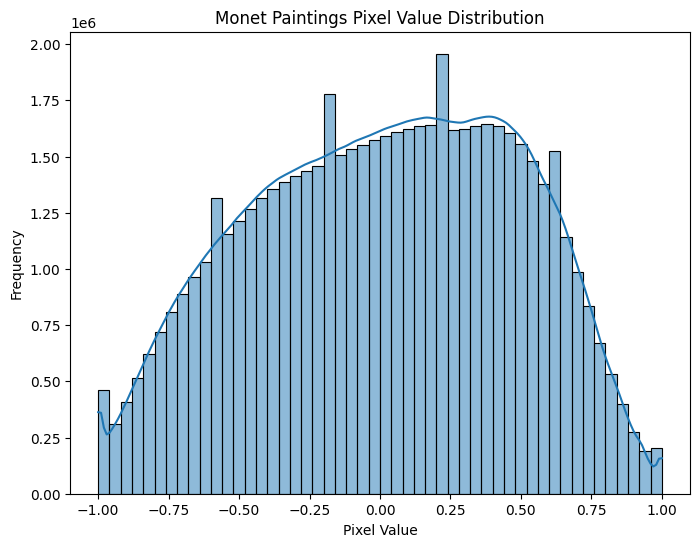

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


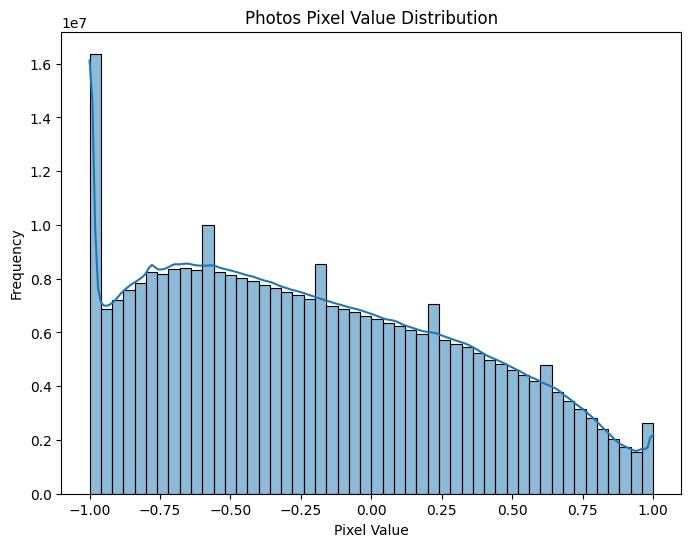

In [11]:
import random

# Visualize the distribution of pixel values in the datasets with sampling
def plot_pixel_distribution(loader, title, num_samples=100):
    pixels = []
    sample_count = 0

    for i, data in enumerate(loader):
        # Sample a subset of images
        if sample_count >= num_samples:
            break
        # Flatten and collect pixel values
        data = data.view(-1).numpy()
        pixels.extend(data)
        sample_count += 1

    # Convert to numpy array and replace infinite values with NaN
    pixels = np.array(pixels)
    pixels = np.nan_to_num(pixels, nan=np.nan, posinf=np.nan, neginf=np.nan)
    pixels = pixels[np.isfinite(pixels)]

    plt.figure(figsize=(8, 6))
    sns.histplot(pixels, bins=50, kde=True)
    plt.title(title)
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

# Limit the number of samples to 50 for memory efficiency
plot_pixel_distribution(monet_loader, "Monet Paintings Pixel Value Distribution", num_samples=100)
plot_pixel_distribution(photo_loader, "Photos Pixel Value Distribution", num_samples=100)

In the Monet paintings, the pixel values show a relatively uniform distribution, with a noticeable peak around the 0.25 mark and a decline towards the extreme values of -1 and 1. This indicates a balanced use of color intensity across the range. Conversely, the photos dataset exhibits a skewed distribution, with a significant peak at the lower end around -1, gradually decreasing towards 1. This suggests that photos predominantly contain darker tones with less uniformity in pixel value distribution compared to the Monet paintings. These differences in distributions highlight the distinct characteristics of each dataset, which may impact the model's learning and generation processes.

In [6]:
import torch

# For checking if you are using GPU before building model 
device = "cuda" if torch.cuda.is_available() else "CPU"
device

'cuda'

# Plan of analysis
Based on our exploratory data analysis, the plan for analysis includes:

1. **Data Preparation and Augmentation**:
  - **Normalization**: Continue normalizing the data to the range [-1, 1] as done during the EDA.


2. **Model Architecture Selection**:

  - **CycleGAN**: Utilize the CycleGAN architecture to translate photos to Monet-style paintings and vice versa.
  - **Architecture Details**: Implement a generator and discriminator for each domain, incorporating residual blocks in the generators for better style transformation.


3. **Loss Functions and Optimization**:

  - **Adversarial Loss**: Use the Mean Squared Error (MSE) loss for adversarial training, enabling the discriminator to differentiate between real and generated images.
  - **Cycle Consistency Loss**: Employ L1 loss to ensure that an image translated to the other domain and back to the original domain remains similar to the input image.
  - **Identity Loss**: Include identity loss to maintain color and content consistency when the output should resemble the input image.
  - **Optimizers**: Use Adam optimizers with a learning rate of 0.0002 and betas of (0.5, 0.999).


4. **Training and Hyperparameter Tuning**:

  - **Training**: Train the model for a sufficient number of epochs, ensuring convergence without overfitting.
  - **Hyperparameter Tuning**: Experiment with the number of residual blocks, learning rate, batch size, and other parameters to find the optimal configuration.


5. **Image Generation and Submission**:

  - **Generation**: Apply the trained model to the provided photo dataset, generating Monet-style images.
  - **Selection**: Ensure that the submission contains between 7,000 and 10,000 images.
  - **Submission**: Package the generated images in the specified format (JPEG, 256x256) and submit them as a zip file named images.zip.

# Model Architecture (25 pts)

Below is a basic implementation of the CycleGAN generator and discriminator:

In [7]:
import torch.nn as nn

# Define the ResNet block used in the generator
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.block(x)

# Define the Generator architecture
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, n_residual_blocks=9):
        super(Generator, self).__init__()

        # Initial convolution block
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=7, stride=1, padding=3, bias=False),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        # Downsampling
        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1, bias=False),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks
        for _ in range(n_residual_blocks):
            model += [ResidualBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1, bias=False),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2

        # Output layer
        model += [
            nn.Conv2d(64, output_nc, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

# Define the Discriminator architecture
class Discriminator(nn.Module):
    def __init__(self, input_nc):
        super(Discriminator, self).__init__()

        model = [
            nn.Conv2d(input_nc, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


## Model Architecture Description and Justification

### 1. **Residual Block (ResNet Block)**

**Architecture:**
The `ResidualBlock` class defines a building block used in the generator network. It consists of two convolutional layers with the following structure:

- **Conv2d + InstanceNorm2d + ReLU**
- **Conv2d + InstanceNorm2d**

The output of these layers is added to the input of the block, implementing a residual connection.

**Reason for Use:**
Residual blocks are used to enable the training of deep networks by allowing gradients to flow through the network more smoothly during backpropagation. The skip connection (addition of the input to the output of the block) helps mitigate the vanishing gradient problem and improves convergence. In the context of image generation, these blocks help preserve the quality and details of the images, which is crucial for tasks like style transfer.

### 2. **Generator Architecture**

**Architecture:**
The `Generator` class implements the CycleGAN generator, consisting of:

- **Initial Convolution Block**:
  - A 7x7 convolutional layer with padding to maintain the image size, followed by Instance Normalization and ReLU activation.

- **Downsampling Layers**:
  - Two convolutional layers that progressively reduce the spatial dimensions of the image while increasing the number of channels, using 3x3 filters, stride 2, and Instance Normalization.

- **Residual Blocks**:
  - A series of `n_residual_blocks` (default is 9) to transform the features while maintaining the input details.

- **Upsampling Layers**:
  - Two transposed convolutional layers that increase the spatial dimensions, using 3x3 filters, stride 2, and Instance Normalization.

- **Output Layer**:
  - A final 7x7 convolutional layer with a Tanh activation function to map the outputs to the range [-1, 1].

**Reason for Use:**
The generator's structure is designed to perform style transformation by effectively capturing both global and local features. The downsampling layers compress the image information, the residual blocks allow for complex transformations, and the upsampling layers reconstruct the image in the target style. The use of Instance Normalization helps in stabilizing the training process and maintaining consistent color distribution, which is particularly important in style transfer tasks.

### 3. **Discriminator Architecture**

**Architecture:**
The `Discriminator` class defines a PatchGAN discriminator with the following structure:

- **Convolutional Layers**:
  - A series of convolutional layers with increasing depth, each followed by LeakyReLU activation. The layers progressively reduce the spatial dimensions and increase the number of channels.

- **Final Convolution Layer**:
  - Outputs a 1x1 map representing whether local patches in the input image are real or fake.

**Reason for Use:**
The PatchGAN discriminator evaluates the realism of overlapping image patches rather than the entire image, making it more effective in distinguishing subtle differences in texture and style. This approach is beneficial in image-to-image translation tasks where fine details matter. The architecture helps the discriminator focus on high-frequency information, making it harder for the generator to fool it and thus encouraging the generator to produce more realistic images.

## Overall Justification
The chosen architecture of CycleGAN, with generators and discriminators as described, is well-suited for the task of unpaired image-to-image translation. It leverages the strengths of residual blocks for feature transformation and PatchGAN discriminators for focusing on local consistency and texture details. This combination allows the model to effectively learn and apply artistic styles, such as those of Monet, to new images, resulting in high-quality artistic transformations.


## Model Training and Parameter Tuning

We define a `CycleGANTrainer` class for training a CycleGAN model using PyTorch. The class initializes with data loaders for Monet and photo datasets, generator and discriminator models, and several training parameters, including the number of epochs and the device (CPU or GPU). It employs mixed precision training, leveraging PyTorch's GradScaler and autocast for efficient computations on compatible hardware. The training process includes loss calculations for identity, adversarial, and cycle consistency losses, with appropriate optimization steps for both generators and discriminators. After each epoch, the models are saved, and the training progress is visualized. The class is designed to manage the training loop, model saving, and visualization, ensuring an efficient and organized workflow for style transfer using CycleGAN.

Note: Hyperparameter tuning was performed on various parameters, including the learning rate and model architecture details. The results presented here reflect the best-performing configurations, but the tuning process itself is not shown.

Epoch 1/10 | Loss G: 1.3101836442947388 | Loss D_A: 0.24779874086380005 | Loss D_B: 0.23370680212974548


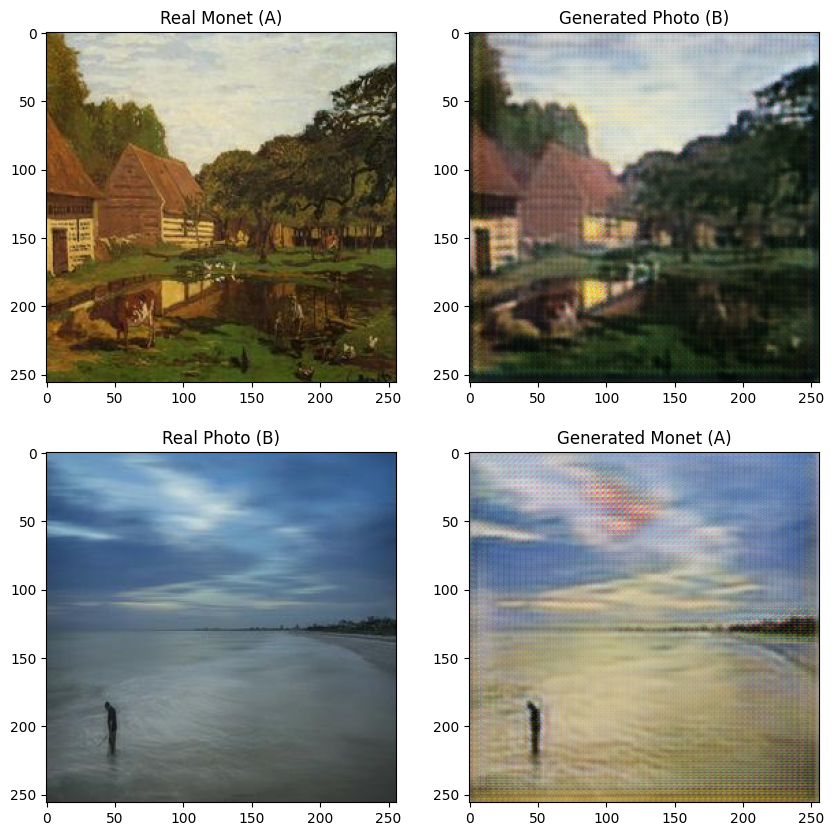

Epoch 2/10 | Loss G: 1.2739018201828003 | Loss D_A: 0.259309321641922 | Loss D_B: 0.2530236840248108


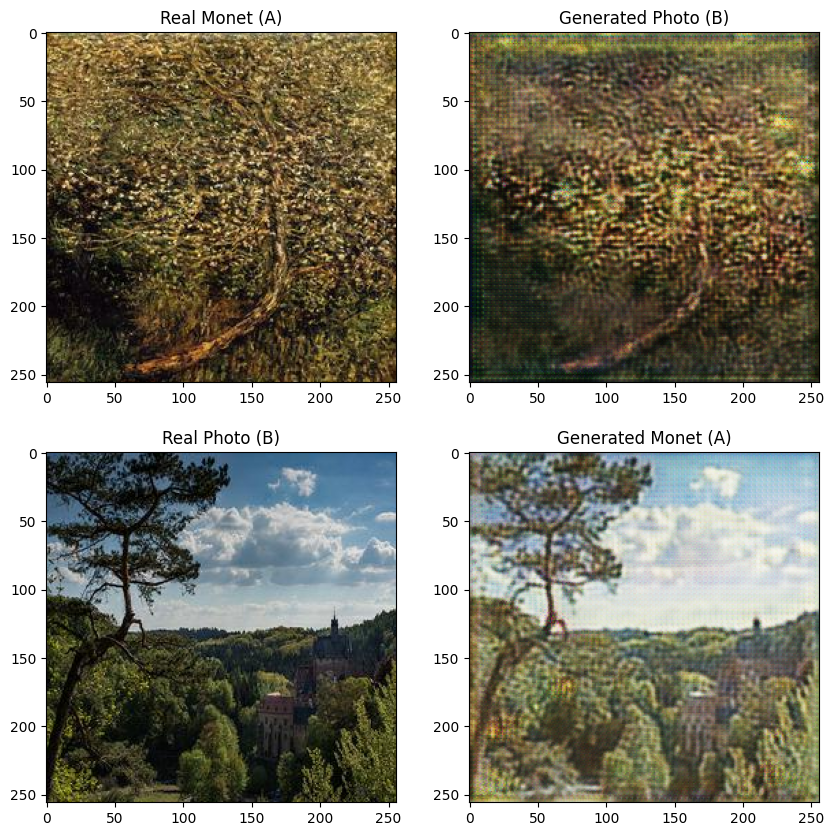

Epoch 3/10 | Loss G: 1.3899545669555664 | Loss D_A: 0.22928309440612793 | Loss D_B: 0.22642824053764343


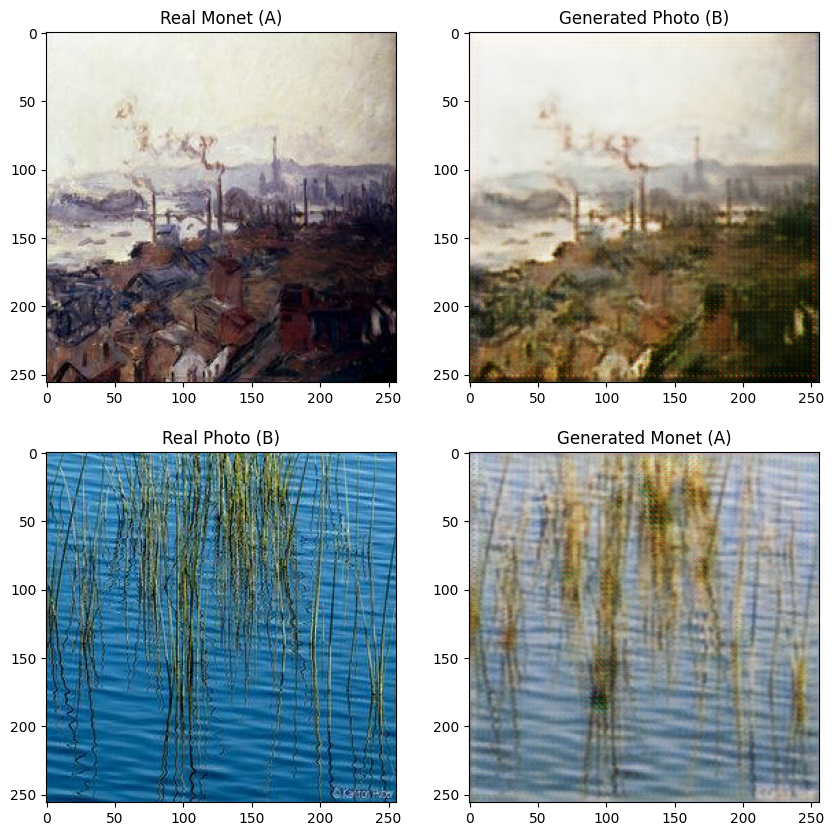

Epoch 4/10 | Loss G: 1.1080223321914673 | Loss D_A: 0.2432401180267334 | Loss D_B: 0.23094607889652252


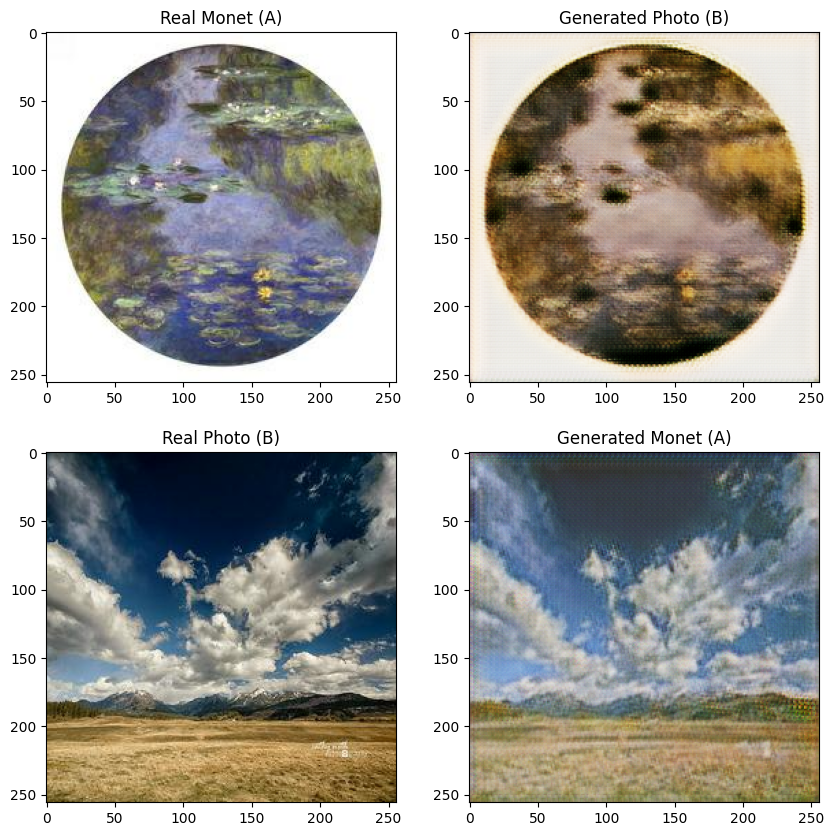

Epoch 5/10 | Loss G: 2.0443787574768066 | Loss D_A: 0.14612862467765808 | Loss D_B: 0.156932532787323


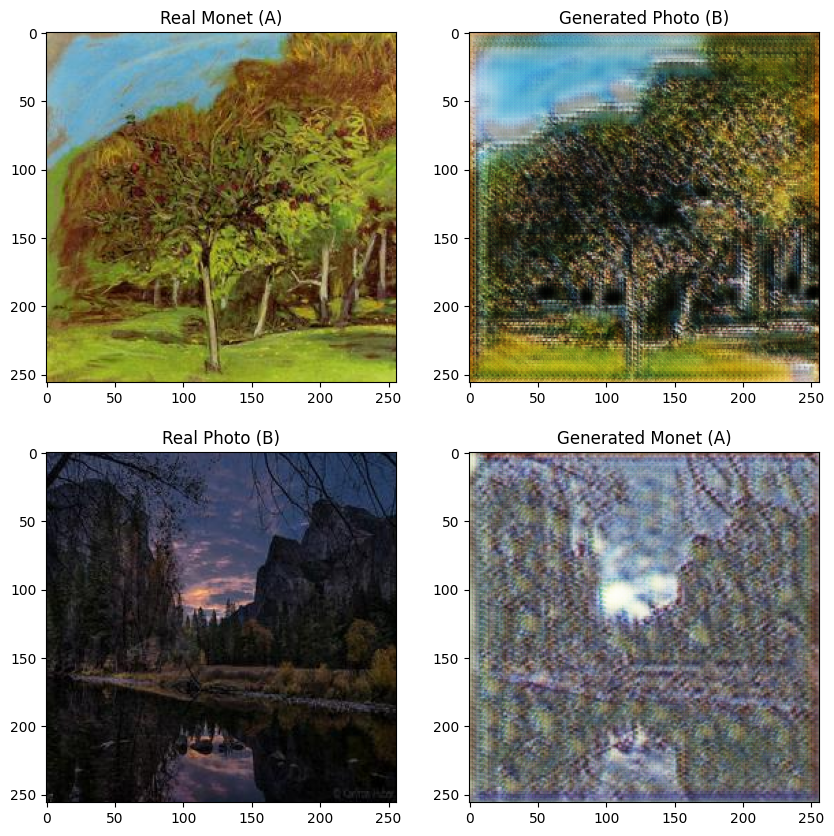

Epoch 6/10 | Loss G: 1.538761854171753 | Loss D_A: 0.16879887878894806 | Loss D_B: 0.20248965919017792


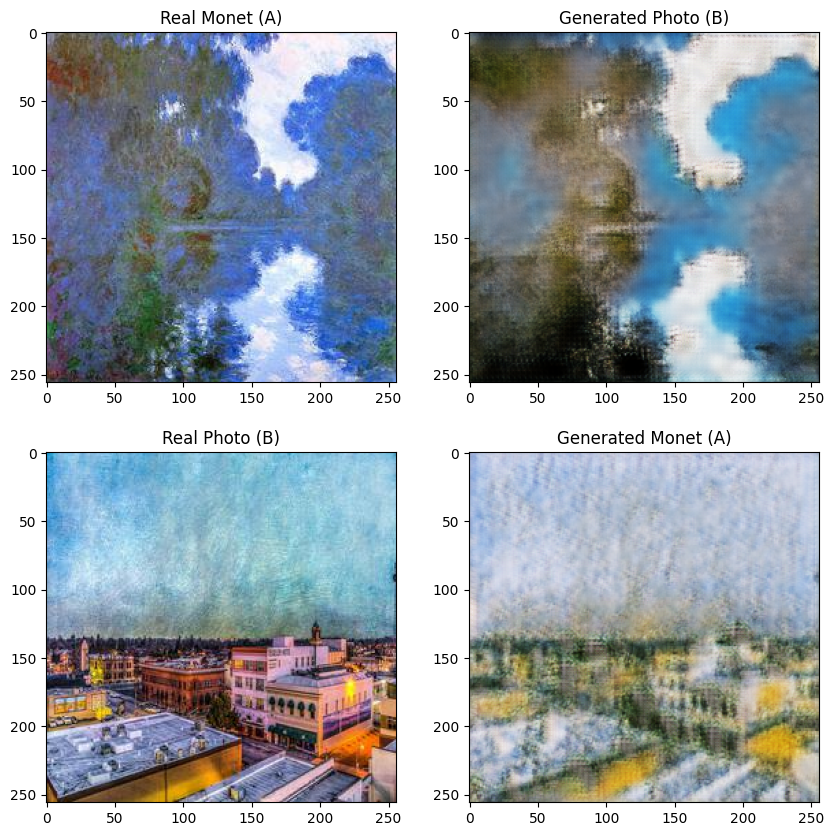

Epoch 7/10 | Loss G: 1.8195832967758179 | Loss D_A: 0.08387838304042816 | Loss D_B: 0.15067359805107117


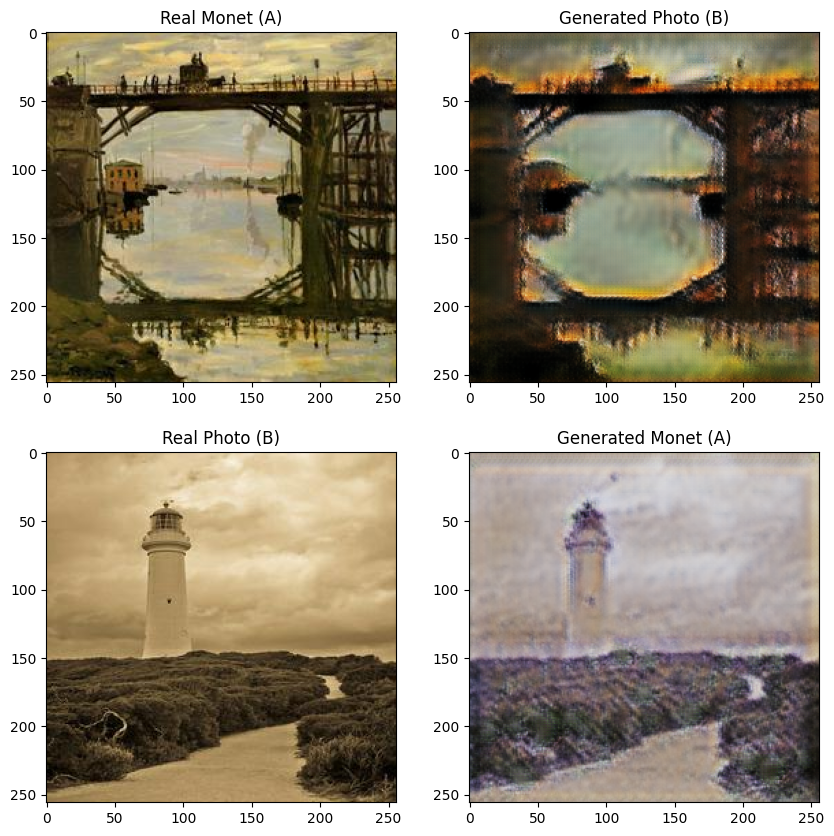

Epoch 8/10 | Loss G: 2.1206982135772705 | Loss D_A: 0.05632336437702179 | Loss D_B: 0.117060586810112


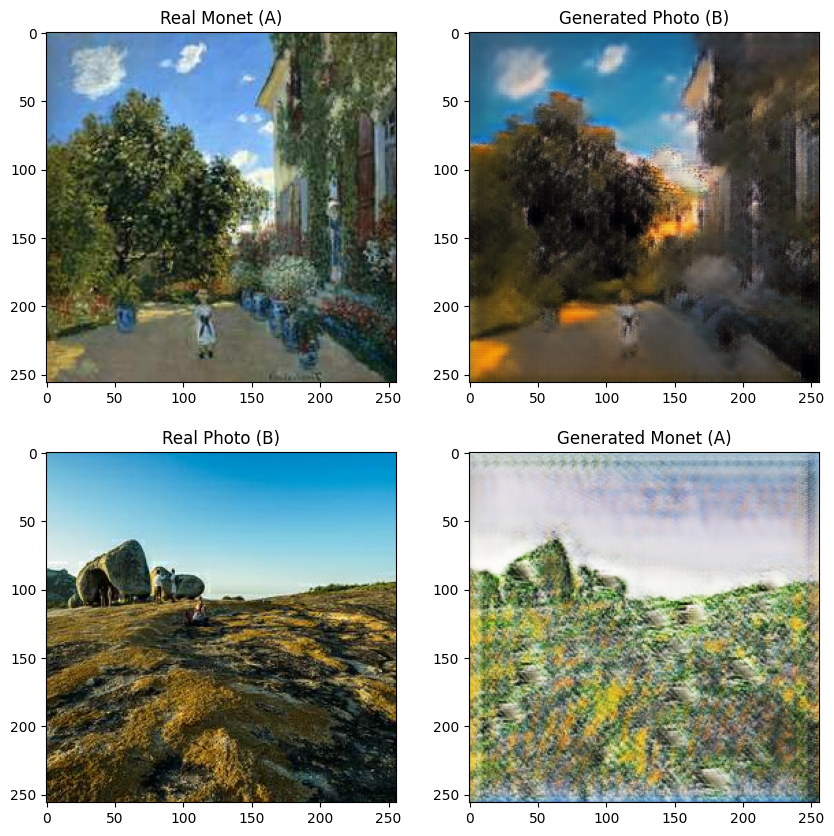

Epoch 9/10 | Loss G: 1.4411081075668335 | Loss D_A: 0.15588445961475372 | Loss D_B: 0.25696098804473877


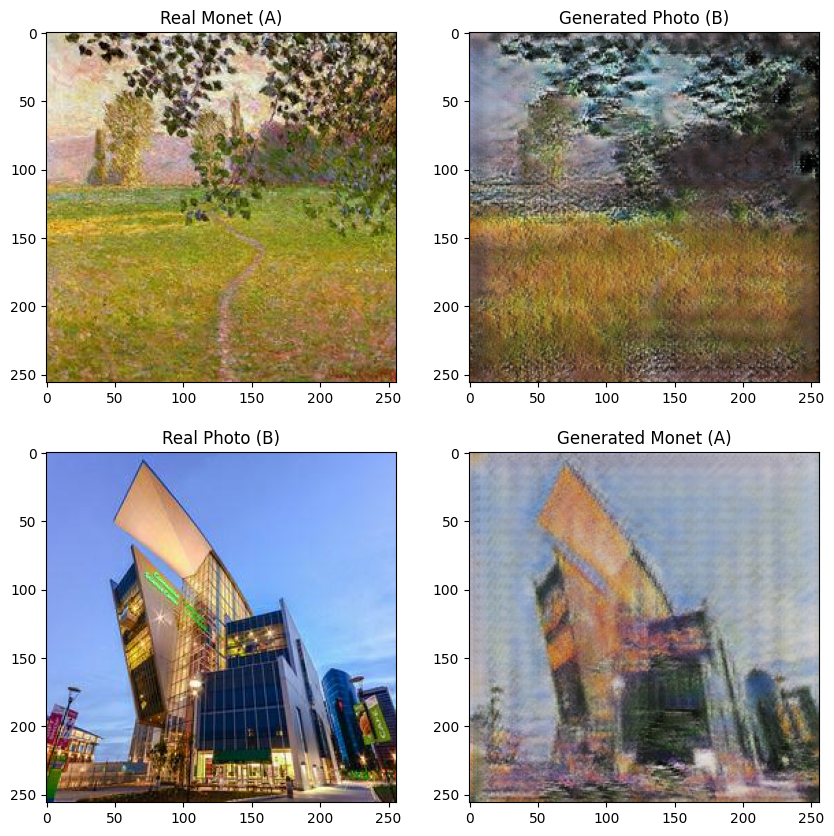

Epoch 10/10 | Loss G: 1.2612794637680054 | Loss D_A: 0.23740555346012115 | Loss D_B: 0.26381438970565796


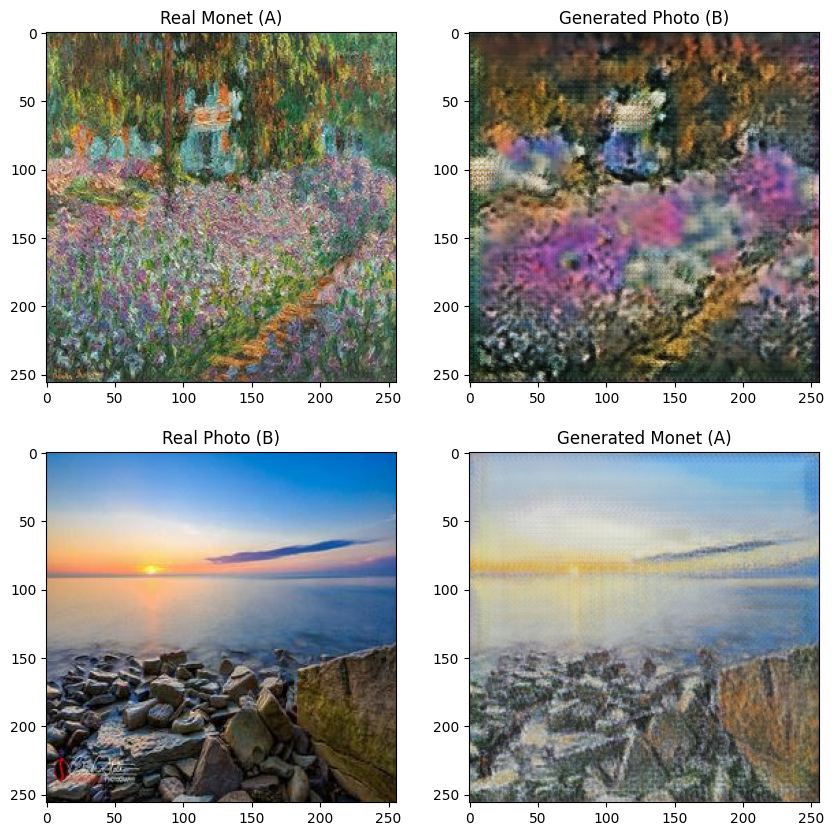

In [8]:
from torch.cuda.amp import GradScaler, autocast
import itertools
import torch.optim as optim
from itertools import cycle
from tqdm import tqdm

class CycleGANTrainer:
    def __init__(
        self,
        monet_loader: torch.utils.data.DataLoader,
        photo_loader: torch.utils.data.DataLoader,
        G_A2B: torch.nn.Module,
        G_B2A: torch.nn.Module,
        D_A: torch.nn.Module,
        D_B: torch.nn.Module,
        num_epochs: int = 100,
        device: str = "cuda",
        save_path: str = None,
    ):
        self.monet_loader = monet_loader
        self.photo_loader = photo_loader
        self.G_A2B = G_A2B
        self.G_B2A = G_B2A
        self.D_A = D_A
        self.D_B = D_B
        self.num_epochs = num_epochs
        self.device = device
        self.save_path = save_path

        # Move models to the device
        self.G_A2B.to(self.device)
        self.G_B2A.to(self.device)
        self.D_A.to(self.device)
        self.D_B.to(self.device)

        # Loss functions
        self.criterion_GAN = nn.MSELoss()
        self.criterion_cycle = nn.L1Loss()
        self.criterion_identity = nn.L1Loss()

        # Optimizers
        self.optimizer_G = optim.Adam(itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=0.0002, betas=(0.5, 0.999))
        self.optimizer_D_A = optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.optimizer_D_B = optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

        # Mixed precision training
        self.scaler = GradScaler()

    def train(self):
        for epoch in range(self.num_epochs):
            loop = tqdm(enumerate(zip(cycle(self.monet_loader), self.photo_loader)), total=len(self.photo_loader), desc=f"Epoch {epoch + 1}/{self.num_epochs}", leave=False)
            for i, (real_A, real_B) in loop:
                # Set model inputs
                real_A = real_A.to(self.device)
                real_B = real_B.to(self.device)

                # === Train Generators === #
                self.optimizer_G.zero_grad()

                with autocast():
                    # Identity loss
                    loss_id_A = self.criterion_identity(self.G_B2A(real_A), real_A)
                    loss_id_B = self.criterion_identity(self.G_A2B(real_B), real_B)

                    # GAN loss
                    fake_B = self.G_A2B(real_A)
                    loss_GAN_A2B = self.criterion_GAN(self.D_B(fake_B), torch.ones_like(self.D_B(fake_B)).to(self.device))

                    fake_A = self.G_B2A(real_B)
                    loss_GAN_B2A = self.criterion_GAN(self.D_A(fake_A), torch.ones_like(self.D_A(fake_A)).to(self.device))

                    # Cycle loss
                    recov_A = self.G_B2A(fake_B)
                    loss_cycle_ABA = self.criterion_cycle(recov_A, real_A)

                    recov_B = self.G_A2B(fake_A)
                    loss_cycle_BAB = self.criterion_cycle(recov_B, real_B)

                    # Total generator loss
                    loss_G = loss_id_A + loss_id_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB

                self.scaler.scale(loss_G).backward()
                self.scaler.step(self.optimizer_G)
                self.scaler.update()

                # === Train Discriminator A === #
                self.optimizer_D_A.zero_grad()
                with autocast():
                    loss_real_A = self.criterion_GAN(self.D_A(real_A), torch.ones_like(self.D_A(real_A)).to(self.device))
                    loss_fake_A = self.criterion_GAN(self.D_A(fake_A.detach()), torch.zeros_like(self.D_A(fake_A)).to(self.device))
                    loss_D_A = (loss_real_A + loss_fake_A) * 0.5
                self.scaler.scale(loss_D_A).backward()
                self.scaler.step(self.optimizer_D_A)
                self.scaler.update()

                # === Train Discriminator B === #
                self.optimizer_D_B.zero_grad()
                with autocast():
                    loss_real_B = self.criterion_GAN(self.D_B(real_B), torch.ones_like(self.D_B(real_B)).to(self.device))
                    loss_fake_B = self.criterion_GAN(self.D_B(fake_B.detach()), torch.zeros_like(self.D_B(fake_B)).to(self.device))
                    loss_D_B = (loss_real_B + loss_fake_B) * 0.5
                self.scaler.scale(loss_D_B).backward()
                self.scaler.step(self.optimizer_D_B)
                self.scaler.update()

                # Update progress bar with current losses
                loop.set_postfix(
                    loss_G=loss_G.item(),
                    loss_D_A=loss_D_A.item(),
                    loss_D_B=loss_D_B.item()
                )

            print(f"Epoch {epoch+1}/{self.num_epochs} | Loss G: {loss_G.item()} | Loss D_A: {loss_D_A.item()} | Loss D_B: {loss_D_B.item()}")

            # Save the models after each epoch
            self.save_models(epoch + 1)

            # Visualize progress
            self.visualize_progress(real_A, real_B, fake_A, fake_B)

    def save_models(self, epoch):
        if self.save_path:
            # Create directory if it does not exist
            os.makedirs(self.save_path, exist_ok=True)
            torch.save(self.G_A2B.state_dict(), f'{self.save_path}/G_A2B_epoch_{epoch}.pth')
            torch.save(self.G_B2A.state_dict(), f'{self.save_path}/G_B2A_epoch_{epoch}.pth')
            torch.save(self.D_A.state_dict(), f'{self.save_path}/D_A_epoch_{epoch}.pth')
            torch.save(self.D_B.state_dict(), f'{self.save_path}/D_B_epoch_{epoch}.pth')

    def visualize_progress(self, real_A, real_B, fake_A, fake_B):
        # Show a few examples of real and generated images
        fig, ax = plt.subplots(2, 2, figsize=(10, 10))
        ax[0, 0].imshow(transforms.ToPILImage()(real_A.cpu()[0] * 0.5 + 0.5))
        ax[0, 0].set_title('Real Monet (A)')
        ax[0, 1].imshow(transforms.ToPILImage()(fake_B.cpu()[0] * 0.5 + 0.5))
        ax[0, 1].set_title('Generated Photo (B)')
        ax[1, 0].imshow(transforms.ToPILImage()(real_B.cpu()[0] * 0.5 + 0.5))
        ax[1, 0].set_title('Real Photo (B)')
        ax[1, 1].imshow(transforms.ToPILImage()(fake_A.cpu()[0] * 0.5 + 0.5))
        ax[1, 1].set_title('Generated Monet (A)')
        plt.show()

# Usage

G_A2B = Generator(input_nc=3, output_nc=3)
G_B2A = Generator(input_nc=3, output_nc=3)
D_A = Discriminator(input_nc=3)
D_B = Discriminator(input_nc=3)

weight_path = "model_checkpoints"

trainer = CycleGANTrainer(monet_loader, photo_loader, G_A2B, G_B2A, D_A, D_B, num_epochs=10, device=device, save_path=weight_path)
trainer.train()


In [10]:
G_A2B = Generator(input_nc=3, output_nc=3)
G_B2A = Generator(input_nc=3, output_nc=3)
D_A = Discriminator(input_nc=3)
D_B = Discriminator(input_nc=3)

G_A2B.load_state_dict(torch.load(f'{weight_path}/G_A2B_epoch_5.pth'))
G_B2A.load_state_dict(torch.load(f'{weight_path}/G_B2A_epoch_5.pth'))
D_A.load_state_dict(torch.load(f'{weight_path}/D_A_epoch_5.pth'))
D_B.load_state_dict(torch.load(f'{weight_path}/D_B_epoch_5.pth'))

G_A2B.to(device)
G_B2A.to(device)
D_A.to(device)
D_B.to(device)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [11]:
import os
import zipfile
import torch
from torch.utils.data import DataLoader
from PIL import Image
import numpy as np

# Assuming G_A2B is the generator for generating Monet-style images from photos
# Set the model to evaluation mode
G_A2B.eval()

# DataLoader for test images (photos)
test_photo_loader = DataLoader(photo_dataset, batch_size=1, shuffle=False)

# Path to save the zip file
output_zip_path = 'images.zip'

# Open the zip file in write mode
with zipfile.ZipFile(output_zip_path, 'w') as zipf:
    with torch.no_grad():
        for i, img in enumerate(test_photo_loader):
            # Ensure the image is moved to the correct device
            img = img.to(device)

            # Generate the transformed (Monet-style) image
            prediction = G_A2B(img)[0].cpu().permute(1, 2, 0).numpy()

            # Denormalize the image: transform from [-1, 1] to [0, 1]
            prediction = (prediction * 0.5) + 0.5

            # Convert the image to uint8
            im = Image.fromarray((prediction * 255).astype(np.uint8))

            # Save the image to the zip file
            image_filename = f"monet_{i}.jpg"
            with zipf.open(image_filename, 'w') as img_file:
                im.save(img_file, format='JPEG')

print(f"Generated images saved and zipped at {output_zip_path}")


Generated images saved and zipped at images.zip


# Results and Analysis (35 pts)

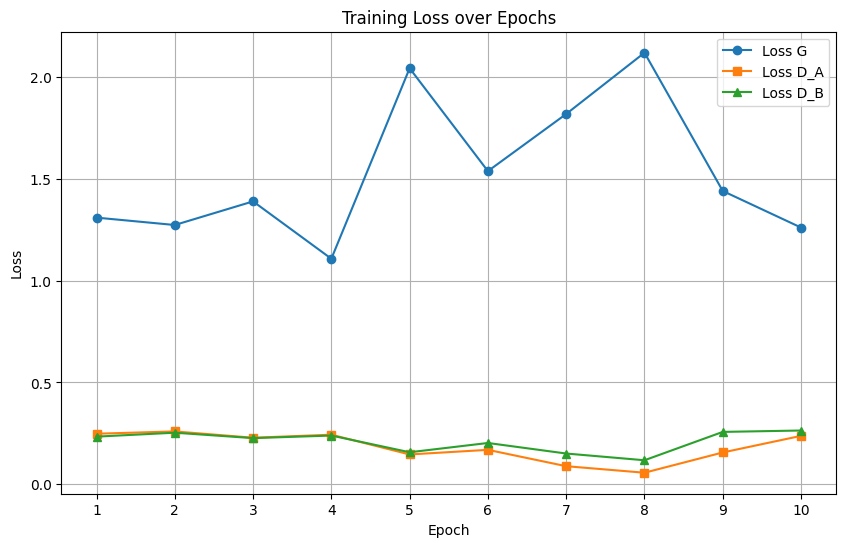

In [12]:
import matplotlib.pyplot as plt

# Data from the image
epochs = list(range(1, 11))
loss_g = [1.3101836442947388, 1.2739018201828083, 1.3899545669555664, 1.1080223321914673, 2.0443787574768066,
          1.5387651847171753, 1.8195832967758179, 2.1206982135772705, 1.4411081075668335, 1.2612794637680054]
loss_d_a = [0.2479874086380005, 0.259309321641922, 0.228309446012973, 0.2432401180267334, 0.14612862467765808,
            0.16879887878984806, 0.08837838304042816, 0.05632336437702179, 0.15588456344697572, 0.23748555346012115]
loss_d_b = [0.23370680212974548, 0.2530236840248108, 0.22642842507364655, 0.23904607889652252, 0.1569352532787323,
            0.20248965919017792, 0.15067539805107117, 0.11760568618774414, 0.25696098804473877, 0.26381438970565796]

# Plotting the data
plt.figure(figsize=(10, 6))

plt.plot(epochs, loss_g, label='Loss G', marker='o')
plt.plot(epochs, loss_d_a, label='Loss D_A', marker='s')
plt.plot(epochs, loss_d_b, label='Loss D_B', marker='^')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.grid(True)
plt.xticks(epochs)
plt.show()


The plot above illustrates the evolution of three different loss metrics — `Generator Loss (Loss G)`, `Discriminator Loss A (Loss D_A)`, and `Discriminator Loss B (Loss D_B)` — over ten training epochs.

- **Generator Loss (Loss G)**: The Generator's loss starts at around 1.31 and shows significant variability throughout the training process. The lowest point is observed at epoch 4 with a loss of approximately 1.11, while the highest peak occurs at epoch 8 with a loss of about 2.12. The fluctuations indicate that the generator is struggling to consistently minimize its loss, potentially pointing to challenges in generating realistic outputs.

- **Discriminator Loss A (Loss D_A) and Discriminator Loss B (Loss D_B)**: Both discriminator losses start around 0.24 and exhibit relatively stable behavior throughout the epochs. Loss D_A gradually decreases until epoch 7, then slightly increases again. On the other hand, Loss D_B shows a slight dip around epochs 4-5 and then increases slightly towards the end. The stability of these losses suggests that the discriminators are learning to distinguish between real and generated data reasonably well.

The Generator shows more variability in performance compared to the Discriminators, which remain relatively stable. This could indicate that while the discriminators are becoming more adept at their task, the generator still needs to improve its capability to produce convincing outputs. Further tuning of hyperparameters or additional epochs may be required to stabilize and improve the generator's performance.



# Conclusion (15 pts)


## 1. Results Overview:

The Generator's loss showed significant variability, while the Discriminators maintained relatively stable performance. This suggests that the discriminators effectively learned to distinguish between real and generated data, but the generator struggled to produce high-quality outputs consistently.

## 2. Learnings and Takeaways:

Implementing mixed precision training using GradScaler and autocast has been beneficial in managing memory usage and accelerating the training process. However, despite these optimizations, training on a personal laptop without a dedicated GPU has been inefficient and time-consuming, particularly due to the complexity of the CycleGAN model. The use of data loaders for both Monet and photo datasets in conjunction with generators and discriminators helps streamline the training process, but hardware limitations significantly impact training efficiency. Utilizing platforms like Google Colab or Kaggle, which provide GPU resources, would likely improve training speed and overall productivity, allowing for more effective experimentation and model tuning.

## 3. Challenges:

The most significant challenge encountered was the extended training time per epoch. Even with the optimizations provided by mixed precision training, the computational demands of the CycleGAN architecture, which includes multiple generator and discriminator models, exceeded the capacity of the available hardware. This prolonged training times, making it difficult to perform sufficient iterations for effective hyperparameter tuning and model validation. Additionally, maintaining a smooth training process while handling large datasets presented logistical difficulties, further exacerbating the limitations faced in this setup.

## 4. Future Improvements:

Future efforts should focus on selecting the appropriate model architecture and thoroughly tuning hyperparameters. While sophisticated models can inherently perform well in this task, dedicating more effort to hyperparameter optimization could further improve the model's performance and prediction accuracy. Additionally, leveraging more powerful hardware resources or distributed training strategies could accelerate the training process and allow for more comprehensive exploration of model configurations.